# Homework 2: Probability Models

BEE 4850/5850, Fall 2024

**Name**: Anthony Nicolaides

**ID**: ajn68

> **Due Date**
>
> Friday, 2/23/24, 9:00pm

## Overview

### Instructions

The goal of this homework assignment is to practice developing and
working with probability models for data.

-   Problem 1 asks you to fit a sea-level rise model using normal
    residuals and to assess the validity of that assumption.
-   Problem 2 asks you to model the time series of hourly
    weather-related variability at a tide gauge.
-   Problem 3 asks you to model the occurrences of Cayuga Lake freezing,
    and is only slightly adapted from Example 4.1 in [Statistical
    Methods in the Atmospheric
    Sciences](https://www.sciencedirect.com/book/9780128158234/statistical-methods-in-the-atmospheric-sciences)
    by Daniel Wilks.
-   Problem 4 (**graded only for graduate students**) asks you to
    revisit the sea-level model in Problem 1 by including a model-data
    discrepancy term in the model calibration.

### Learning Outcomes

After completing this assignments, students will be able to:

-   develop probability models for data and model residuals under a
    variety of statistical assumptions;
-   evaluate the appropriateness of those assumptions through the use of
    qualitative and quantitative evaluations of goodness-of-fit;
-   fit a basic Bayesian model to data.

### Load Environment

The following code loads the environment and makes sure all needed
packages are installed. This should be at the start of most Julia
scripts.

In [1]:
import Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()

  Activating project at `~/Documents/BEE5850/hw/hw02_BEE5850`


The following packages are included in the environment (to help you find
other similar packages in other languages). The code below loads these
packages for use in the subsequent notebook (the desired functionality
for each package is commented next to the package).

In [2]:
using Random # random number generation and seed-setting
using DataFrames # tabular data structure
using CSV # reads/writes .csv files
using Distributions # interface to work with probability distributions
using Plots # plotting library
using StatsBase # statistical quantities like mean, median, etc
using StatsPlots # some additional statistical plotting tools
using Optim # optimization tools

## Problems (Total: 30 Points for 4850; 40 for 5850)

## Problem 1

Consider the following sea-level rise model from [Rahmstorf
(2007)](https://doi.org/10.1073/pnas.0907765106):

$\frac{dH(t)}{dt}$ = $\alpha$ $(T(t) - T_0)$, where $T_0$ is the
temperature (in $^\circ C$) where sea-level is in equilibrium
($dH/dt = 0$), and $\alpha$ is the sea-level rise sensitivity to
temperature. Discretizing this equation using the Euler method and using
an annual timestep ($\delta t = 1$), we get
$$H(t+1) = H(t) + \alpha (T(t) - T_0).$$

**In this problem**:

-   Load the data from the `data/` folder
    -   Global mean temperature data from the HadCRUT 5.0.2.0 dataset
        (<https://hadobs.metoffice.gov.uk/hadcrut5/data/HadCRUT.5.0.2.0/download.html>)
        can be found in
        `data/HadCRUT.5.0.2.0.analysis.summary_series.global.annual.csv`.
        This data is averaged over the Northern and Southern Hemispheres
        and over the whole year.
    -   Global mean sea level anomalies (relative to the 1990 mean
        global sea level) are in `data/CSIRO_Recons_gmsl_yr_2015.csv`,
        courtesy of CSIRO
        (<https://www.cmar.csiro.au/sealevel/sl_data_cmar.html>).
-   Fit the model under the assumption of normal i.i.d. residuals by
    maximizing the likelihood and report the parameter estimates. Note
    that you will need another parameter $H_0$ for the initial sea
    level. What can you conclude about the relationship between global
    mean temperature increases and global mean sea level rise?
-   How appropriate was the normal i.i.d. probability model for the
    residuals? Use any needed quantitative or qualitative assessments of
    goodness of fit to justify your answer. If this was not an
    appropriate probability model, what would you change?

In [3]:
Temp = CSV.read("data/HadCRUT.5.0.2.0.analysis.summary_series.global.annual.csv", DataFrame)
Sea = CSV.read("data/CSIRO_Recons_gmsl_yr_2015.csv", DataFrame)
T = Temp[!, "Anomaly (deg C)"]
H = Sea[!, "GMSL (mm)"];

In [4]:
function sea_level_model(T, p=(1.0, 1.0, 1.0))
    H0, T0, alpha = p[1:3]
    # H(t+1) = H(t) + a(T(t)-T0)
    # H(t) = H(t-1) + a(T(t-1)-T0)
    H = [H0 + (alpha * (T0 - T0))]
    for t in 2:length(T)
        push!(H, H[t-1] + (alpha * (T[t-1] - T0)))
    end
    return H
end

#p are the model parameters, σ the standard deviation of the normal errors, y is the data, m the model function
function log_likelihood(p, stdv, y, m)
    y_pred = m(p)
    ll = sum(logpdf.(Normal.(y_pred, stdv), y))
end

sea_level_model_wrap(params) = sea_level_model(T, params)

lower = [-200.0, -200.0, -200.0, 0.0]
upper = [100.0, 100.0, 100.0, 100.0]
p0 = [mean(H), mean(T), 1.0, 1.0] # H0, T0, a, stdev

result = Optim.optimize(params -> -log_likelihood(params[1:end-1], params[end], T, sea_level_model_wrap), lower, upper, p0)

H0, T0, a, stdv = result.minimizer

4-element Vector{Float64}:
 -0.4024326872662764
 -0.42535752076688055
  0.022760950571462914
  0.12507855795228173

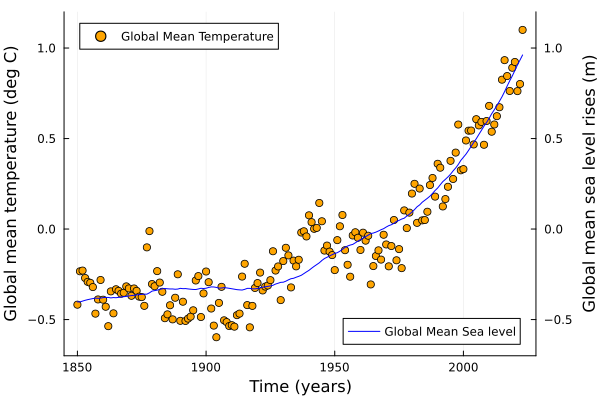

In [5]:
scatter(Temp[!, "Time"], T, label="Global Mean Temperature",
    xlabel="Time (years)", ylabel="Global mean temperature (deg C)",
    ylims=(-0.7, 1.20), color=:orange, legend=:topleft)
plot!(twinx(), Temp[!, "Time"], sea_level_model_wrap((H0, T0, a)),
    label="Global Mean Sea level", ylabel="Global mean sea level rises (m)",
    ylims=(-0.7, 1.20), color=:blue,
    legend=:bottomright)

Based on the model, there is a very clear positive relationship between glabel mean temperature and glabel mean sea level as time progresses. As the temperature rises, so does the sea levels. 

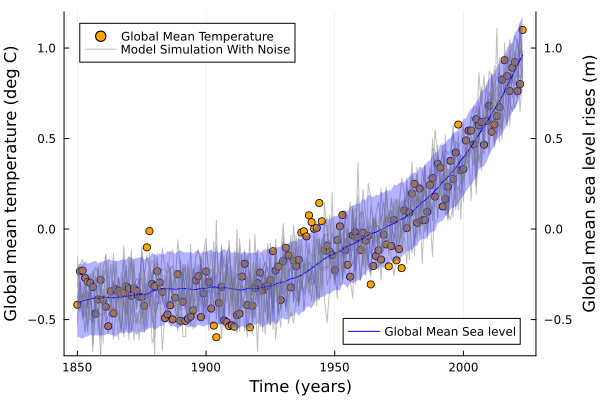

In [6]:
residuals = rand(Normal(0, stdv), (1000, length(T)))
model_out = sea_level_model_wrap((H0, T0, a))
model_sim = residuals .+ model_out';

q_90 = mapslices(col -> quantile(col, [0.05, 0.95]), model_sim, ; dims=1) # compute 90% prediction interval

scatter(Temp[!, "Time"], T, label="Global Mean Temperature",
    xlabel="Time (years)", ylabel="Global mean temperature (deg C)",
    ylims=(-0.7, 1.20), color=:orange, legend=:topleft)
plot!(twinx(), Temp[!, "Time"], sea_level_model_wrap((H0, T0, a)),
    label="Global Mean Sea level", ylabel="Global mean sea level rises (m)",
    ylims=(-0.7, 1.20), color=:blue, legend=:bottomright,
    ribbon=(model_out .- q_90[1, :], q_90[2, :] .- model_out), fillalpha=0.3)
plot!(Temp[!, "Time"], model_sim[1, :], color=:grey, linewidth=1, label="Model Simulation With Noise", alpha=0.5)
plot!(Temp[!, "Time"], model_sim[2:10, :]', color=:grey, linewidth=1, label=false, alpha=0.5)


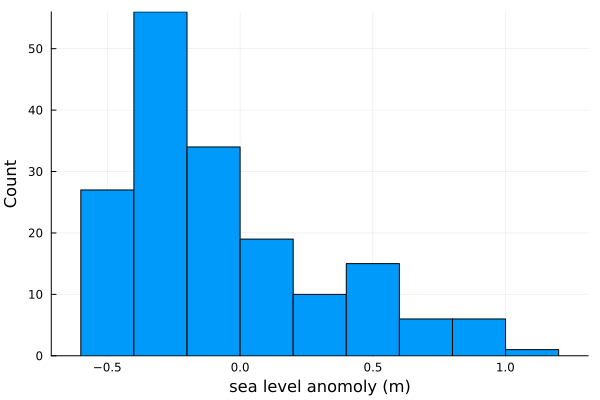

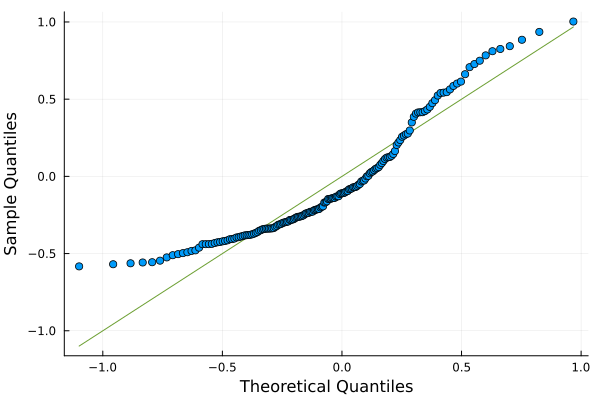

In [7]:
display(histogram(model_sim[1, :],
    xlabel="sea level anomoly (m)", ylabel="Count", label=""))
display(qqplot(Normal, model_sim[1, :],
    xlabel="Theoretical Quantiles", ylabel="Sample Quantiles"))

Using Normal i.i.d. probability model for the residuals is not too appropriate. Based on the QQ plot, the normal distribution does not do a very good job at capturing the residuals. Furthermore, the histogram of the residuals reveals an asymmetric distribution. If I could change one thing it would be to change the use of residuals. I would try to use AR(1) for example.

## Problem 2

Tide gauge data is complicated to analyze because it is influenced by
different harmonic processes (such as the linear cycle). In this
problem, we will develop a model for this data using [NOAA data from the
Sewell’s Point tide
gauge](https://tidesandcurrents.noaa.gov/waterlevels.html?id=8638610)
outside of Norfolk, VA from `data/norfolk-hourly-surge-2015.csv`. This
is hourly data (in m) from 2015 and includes both the observed data
(`Verified (m)`) and the tide level predicted by NOAA’s sinusoidal model
for periodic variability, such as tides and other seasonal cycles
(`Predicted (m)`).

**In this problem**: 

\* Load the data file. Take the difference between
the observations and the sinusoidal predictions to obtain the tide level
which could be attributed to weather-related variability (since for one
year sea-level rise and other factors are unlikely to matter). Plot this
data. 

\* Develop an autoregressive model for the weather-related
variability in the Norfolk tide gauge. Make sure to include your logic
or exploratory analysis used in determining the model specification. 

\* Use your model to simulate 1,000 realizations of hourly tide gauge
observations. What is the distribution of the maximum tide level? How
does this compare to the observed value?

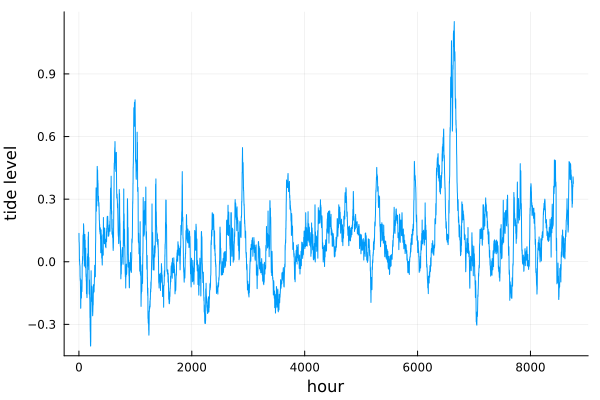

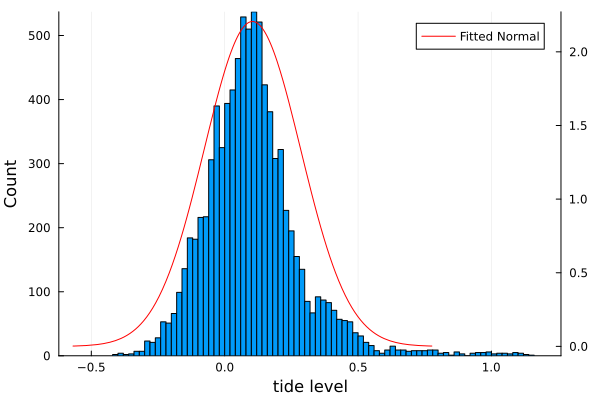

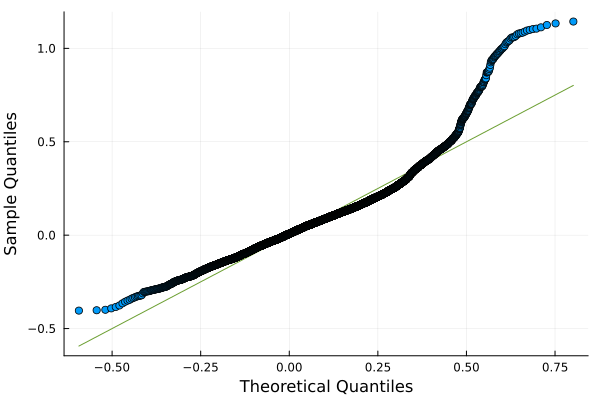

In [8]:
Tide = CSV.read("data/norfolk-hourly-surge-2015.csv", DataFrame)
tide_predicted = Tide[!, "Predicted (m)"]
tide_verified = Tide[!, "Verified (m)"]

weather_variability = tide_verified .- tide_predicted
display(plot(weather_variability, xlabel="hour", ylabel="tide level", label=""))
(histogram(weather_variability, xlabel="tide level", ylabel="Count", label=""))
display(plot!(twinx(), fit(Normal, weather_variability), label="Fitted Normal", color=:red))
display(qqplot(Normal, weather_variability, xlabel="Theoretical Quantiles", ylabel="Sample Quantiles"))

A Normal distribution is used for the AR(1). For most of the QQ plot (besides the ends), the data follows the line. Also, the histogram also shows this. Of couse the actually data is slightly right skewed which will affect the results, but the majority of the data does fall under a normal distribution.

In [9]:
# p are the model parameters
# σ the standard deviation of the AR(1) errors, 
# ρ is the autocorrelation coefficient
# y is the verified data
# y_pred is the predicted data
function ar_log_likelihood(p, y=tide_verified, y_pred=tide_predicted)
    stdv, rho = p
    ll = 0 # initialize log-likelihood counter
    residuals = y_pred .- y
    ll += logpdf(Normal(0, stdv / sqrt(1 - (rho^2))), residuals[1])
    for i = 1:length(residuals)-1
        residuals_whitened = residuals[i+1] - rho * residuals[i]
        ll += logpdf(Normal(0, stdv), residuals_whitened)
    end
    return ll
end
ar_log_likelihood_wrap(params) = ar_log_likelihood(params, tide_verified, tide_predicted)

# -1 is the lowest value rho can be
# +1 is the largest value rho can be
# 0 for p0 rho as it starts with no correlation assumed
#
# 0 for lower stdv --> cant be negative
# 1.0 for stdv, the optimal stdv is ~0.99 so the upper is set to be larger
# 0.5 for p0 sdtv, it doesn't seem that changing this value does much, 
#   so its starts in the middle of the uppler and lower
lower = [0.0, -1.0]
upper = [1.0, 1.0]
p0 = [0.5, 0.0]

result = Optim.optimize(params -> -ar_log_likelihood_wrap(params), lower, upper, p0)
stdv, rho = result.minimizer

2-element Vector{Float64}:
 0.019663589611186038
 0.9956392098240645

In [10]:
# ar1 simulations
n_samples = 1000
residuals_ar1 = zeros(n_samples, length(tide_verified))
residuals_ar1[:, 1] = rand(Normal(0, stdv / sqrt(1 - rho^2)), n_samples)
for i = 2:size(residuals_ar1)[2]
    residuals_ar1[:, i] .= rand.(Normal.(1 * residuals_ar1[:, i-1], stdv))
end
model_ar1 = ar_log_likelihood_wrap((stdv, rho))
model_sim_ar1 = residuals_ar1 .+ model_ar1'

maximum_values = vec(maximum(model_sim_ar1, dims=2));

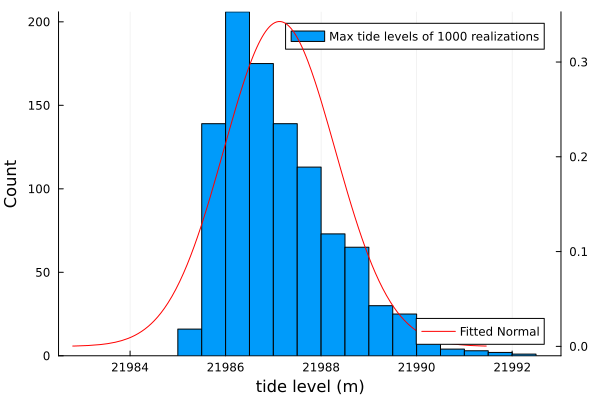

In [11]:
histogram(maximum_values, xlabel="tide level (m)", ylabel="Count",
    label="Max tide levels of 1000 realizations")
plot!(twinx(), fit(Normal, maximum_values), label="Fitted Normal",
    legend=:bottomright, color=:red)

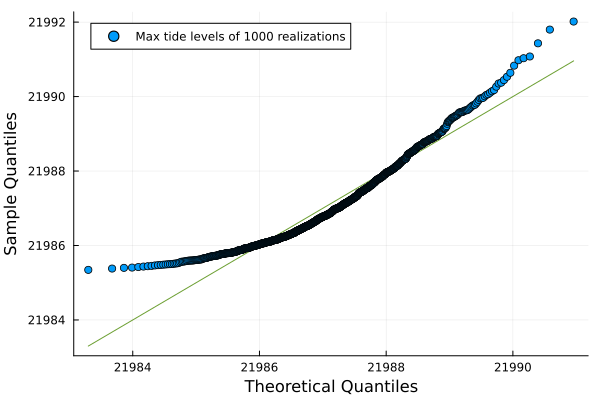

In [12]:
qqplot(Normal, maximum_values, label="Max tide levels of 1000 realizations",
    xlabel="Theoretical Quantiles", ylabel="Sample Quantiles", legend=true)

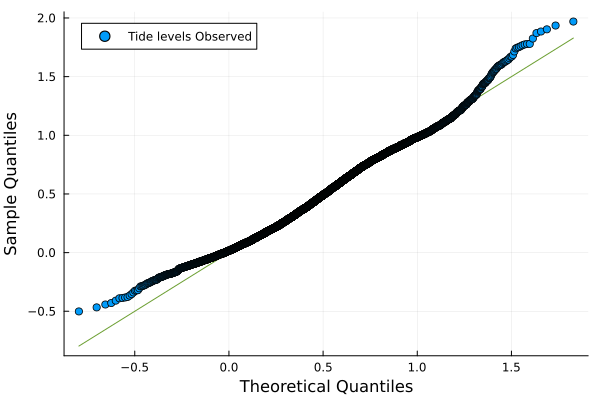

In [13]:
qqplot(Normal, tide_verified, label="Tide levels Observed",
    xlabel="Theoretical Quantiles", ylabel="Sample Quantiles", legend=true)

The distribution of max tide levels seems to follow a normal distribution. The observed tide levels also follow a normal distribution, albiet a bit more consistently than the maximum tide levels. 

## Problem 3

As of 2010, Cayuga Lake has frozen in the following years: 1796, 1816,
1856, 1875, 1884, 1904, 1912, 1934, 1961, and 1979. Based on this data,
we would like to project whether Cayuga Lake is likely to freeze again
in the next 25 years.

**In this problem**:

-   Assuming that observations began in 1780, write down a Bayesian
    model for whether Cayuga Lake will freeze in a given year, using a
    Bernoulli distribution. How did you select what prior to use?
-   Find the maximum *a posteriori* estimate using your model.
-   Generate 1,000 realizations of Cayuga Lake freezing occurrences from
    1780 to 2010 and check the simulations against the occurrance data.
-   Using your model, calculate the probability of Cayuga Lake freezing
    at least once in the next 10 years.
-   What do you think about the validity of your model, both in terms of
    its ability to reproduce historical data and its use to make future
    projections? Why might you believe or discount it? What changes
    might you make (include thoughts about the prior)?

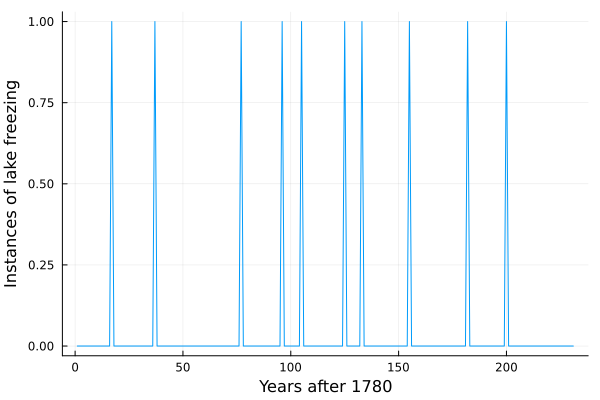

In [14]:
lakes = zeros(2010 - 1780 + 1)
frozen = [1796, 1816, 1856, 1875, 1884, 1904, 1912, 1934, 1961, 1979]
for f in frozen
    i = f - 1780 + 1
    lakes[i] = 1
end
plot(lakes,
    xlabel="Years after 1780",
    ylabel="Instances of lake freezing",
    label="")

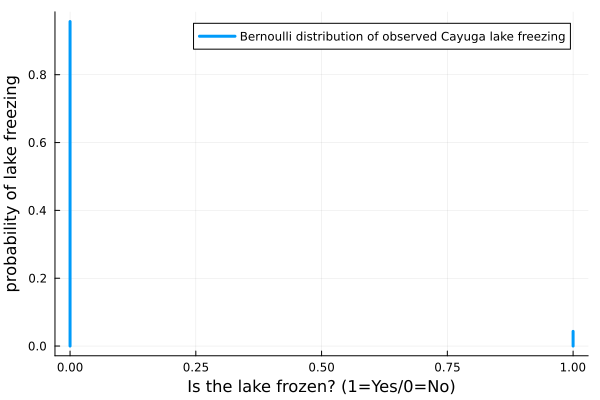

In [15]:
observed_dist = Bernoulli(length(frozen) / length(lakes))
plot(observed_dist, xlabel="Is the lake frozen? (1=Yes/0=No)",
    ylabel="probability of lake freezing",
    label="Bernoulli distribution of observed Cayuga lake freezing",
    linewidth=3)

In [16]:
length(frozen) / length(lakes)

0.04329004329004329

This is the percent of years where Cayuga lake froze. By using a Beta distribution (since its only from 0 and 1 it is useful when using probabilities and Bernoulli distributions), we can make it so that the probability of the lake freeze is roughly equal to this percentage.

In [17]:
1 - cdf(Beta(7, 2), 1 - (length(frozen) / length(lakes)))

0.04409095225736859

Beta(7,2) distribution gives back a similar percentage of the time the lake will be frozen to historical data.

In [18]:
lake_ll(θ) = sum(logpdf(Bernoulli(θ), lakes .== 1))
lake_lprior(θ) = logpdf(Beta(7, 2), θ)
lake_lposterior(θ) = lake_ll(θ) + lake_lprior(θ)
map = Optim.optimize(θ -> -(lake_lposterior(θ)), 0, 1).minimizer

0.06722689127676164

The priori was picked because a Beta distribution is from 0 to 1, making it useful for probabilities and Bernoulli distributions. I also found the percentage of years that the lake was frozen (~0.04) and the priori gives back similar results when given the historical data. 

The maximum a posteriori was found to be 0.067

In [19]:
# ar1 simulations
n_samples = 1000
simulation_ar1 = zeros(n_samples, length(lakes))
simulation_ar1[:, 1] = rand(Beta(7, 2), n_samples)
for i = 2:size(simulation_ar1)[2]
    simulation_ar1[:, i] .= rand(Beta(7, 2), n_samples)
end

# record results
reach_threshold = 0
threshold_array = zeros(length(lakes))
for j in 1:length(lakes)
    for i in simulation_ar1[j, :]
        if i >= 1 - (length(frozen) / length(lakes))
            reach_threshold = reach_threshold + 1
        end
    end
    threshold_array[j] = reach_threshold
    reach_threshold = 0
end

In [20]:
mean(threshold_array)

9.956709956709958

The average amount of times the lake froze from 1780-2010 in my batch of simulation is about 10.02. This is consistent with historical data that also has 10 instance of the lake freezing from 1780-2010.

In [21]:
n_samples = 1000
residuals_ar1 = zeros(n_samples, length(lakes) + 10)
residuals_ar1[:, 1] = rand(Beta(7, 2), n_samples)
for i = 2:size(residuals_ar1)[2]
    residuals_ar1[:, i] .= rand(Beta(7, 2), n_samples)
end
model_ar1 = lake_ll(map)
model_sim_ar1 = residuals_ar1 .+ model_ar1';

#record data
reach_threshold = 0
threshold_array = zeros(1000)#length(lakes)+10)
for j in 1:1000
    for i in residuals_ar1[j, end-9:end]
        if i >= 1 - (length(frozen) / length(lakes)) # p(lake will freeze)
            reach_threshold = reach_threshold + 1
        end
    end
    threshold_array[j] = reach_threshold
    reach_threshold = 0
end

In [22]:
1 - (count(!iszero, threshold_array) / length(threshold_array))

0.634

The probability that the lake will freeze over at least once in the next 10 years is about 0.629. This was done by running 1000 simulations from 1780 to 2020. Then I only looked at the most recent decade of each simulation and counted how many time a lake froze. Then dividing to get a probability.

I believe the model's ability to reproduce historical data is solid. however I would also say the model overal isn't too reliable. One of the biggest issues is me using the same data in the model to find a priori, which can lead to a bias in the results. I would have to do more research on lake freezing / relavent topics to figure out what a reasonable priori is wihtout using the model's data.

## Problem 4

<span style="color:red;">GRADED FOR 5850 STUDENTS ONLY</span>

For the sea-level model in Problem 1, model the model-data discrepancy
using an AR(1) process, with observation error modeled as normally
distributed with standard deviation given by the uncertainty column in
the data file.

**In this problem**:

-   Find the maximum likelihood estimate of the parameters with this
    discrepancy structure. How does the parameter inference change from
    the normal i.i.d. estimate in Problem 1?
-   Generate 1,000 traces, plot a comparison of the hindcasts to those
    from Problem 1, and compare the surprise indices.
-   Determine whether you have accounted for autocorrelation in the
    residuals appropriately (hint: generate realizations of just the
    discrepancy series, compute the resulting residuals from the model
    fit + discrepancy, and look at the distribution of autocorrelation
    values).
-   Which model specification would you prefer and why?

:::

In [23]:
function sea_level_model(T, p=(1.0, 1.0, 1.0))
    H0, T0, alpha = p[1:3]
    # H(t+1) = H(t) + a(T(t)-T0)
    # H(t) = H(t-1) + a(T(t-1)-T0)
    H = [H0 + (alpha * (T0 - T0))]
    for t in 2:length(T)
        push!(H, H[t-1] + (alpha * (T[t-1] - T0)))
    end
    return H
end

sea_level_model (generic function with 2 methods)

In [24]:
function ar_covariance_mat(stdv, rho, y_err)
    H = abs.((1:length(y_err)) .- (1:(length(y_err)))') # get lags
    Z_var = stdv^2 / (1 - rho^2)
    S = rho .^ H * Z_var
    for i in 1:length(y_err)
        S[i, i] += y_err[i]^2
    end
    return S
end

function ar_discrep_log_likelihood(p, stdv, rho, y, m, y_err)
    y_pred = m(p)
    residuals = y_pred .- y
    S = ar_covariance_mat(stdv, rho, y_err)
    ll = logpdf(MvNormal(zeros(length(y)), S), residuals)
    return ll
end

sea_level_model_wrap(params) = sea_level_model(T, params)

lower = [-200.0, -200.0, -200.0, 0.0, -1.0]
upper = [100.0, 100.0, 100.0, 10.0, 1.0]
p0 = [mean(H), mean(T), 1.0, 1.0, 0.5] # H0, T0, a, stdev, rho
result = Optim.optimize(params -> -ar_discrep_log_likelihood(params[1:end-2],
        params[end-1],
        params[end],
        T,
        sea_level_model_wrap,
        Temp[!, "Upper confidence limit (97.5%)"] / 2),
    lower, upper, p0)
H0_ar, T0_ar, a_ar, stdv_ar, rho = result.minimizer

5-element Vector{Float64}:
 -0.33624258275593166
 -0.41824428410852904
  0.02006485266207913
  0.05449221101443865
  0.7672509896467464

Parameter inference changes from normal i.i.d. to AR(1) with discrepency by having H0, T0, alpha, and the standard deviation be slightly lower in value. AR(1) also utilized the parameter rho which normal i.i.d. didn't.

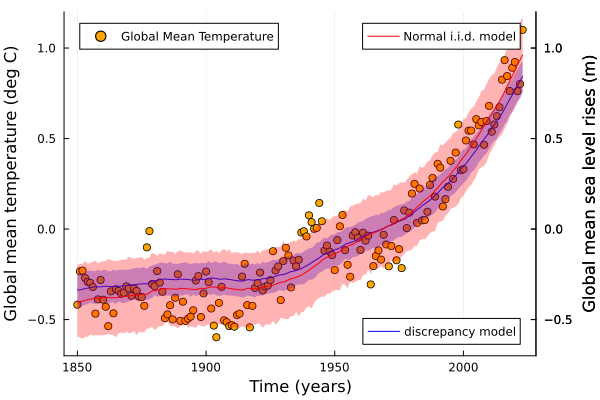

In [25]:
residuals_ar = rand(Normal(0, stdv_ar), (1000, length(T)))
model_out_ar = sea_level_model_wrap((H0_ar, T0_ar, a_ar))
model_sim_ar = residuals_ar .+ model_out_ar';

q_90_ar = mapslices(col -> quantile(col, [0.05, 0.95]), model_sim_ar, ; dims=1) # compute 90% prediction interval
q_90 = mapslices(col -> quantile(col, [0.05, 0.95]), model_sim, ; dims=1) # compute 90% prediction interval

scatter(Temp[!, "Time"], T, label="Global Mean Temperature",
    xlabel="Time (years)", ylabel="Global mean temperature (deg C)",
    ylims=(-0.7, 1.20), color=:orange, legend=:topleft)

plot!(twinx(), Temp[!, "Time"], sea_level_model_wrap((H0_ar, T0_ar, a_ar)),
    label="discrepancy model", ylabel="Global mean sea level rises (m)",
    ylims=(-0.7, 1.20), color=:blue, legend=:bottomright,
    ribbon=(model_out_ar .- q_90_ar[1, :], q_90_ar[2, :] .- model_out_ar), fillalpha=0.3)

plot!(twinx(), Temp[!, "Time"], sea_level_model_wrap((H0, T0, a)),
    label="Normal i.i.d. model", ylabel="Global mean sea level rises (m)",
    ylims=(-0.7, 1.20), color=:red, legend=:topright,
    ribbon=(model_out .- q_90[1, :], q_90[2, :] .- model_out), fillalpha=0.3)

In [26]:
surprises = 0 # initialize surprise counter
# go through the data and check which points are outside of the 90% interval
for i = 1:length(T)
    ## The || operator is an OR, so returns true if either of the terms are true
    if (T[i] < q_90[1, i]) || (q_90[2, i] < T[i])
        surprises += 1
    end
end
surprise_i_iid = surprises / length(T)

surprises = 0 # initialize surprise counter
# go through the data and check which points are outside of the 90% interval
for i = 1:length(T)
    ## The || operator is an OR, so returns true if either of the terms are true
    if (T[i] < q_90_ar[1, i]) || (q_90_ar[2, i] < T[i])
        surprises += 1
    end
end
surprise_i_discrep = surprises / length(T)

println("surprise index of Normal i.i.d. = ", surprise_i_iid)
println("surprise index of Discrepancy model = ", surprise_i_discrep)

surprise index of Normal i.i.d. = 0.09770114942528736
surprise index of Discrepancy model = 0.5114942528735632


The hindcast for the normal i.i.d. model covers more area and data points. This is also shown in the surprise index where is is ~0.097. This is good because it means roughly 10% of the data points are outside the 90% confidence interval. To contrast, the discrepancy model hindcast is more narrow and therefore has a higher surprise index of 0.51. This means that over 50% of the data points are not contained in the 90% confidence intveral.

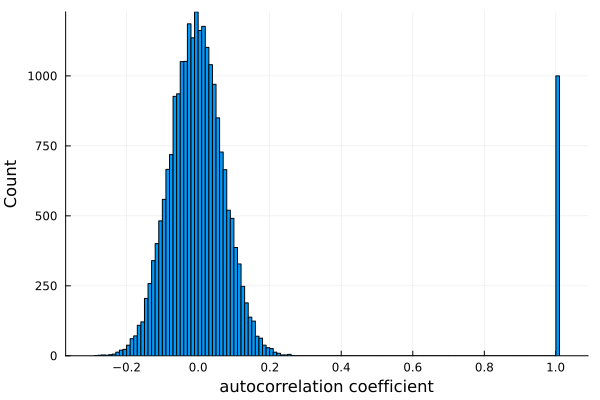

In [27]:
# collect all the autocorrelation from the residuals
autocor_array = []
for i in 1:1000
    push!(autocor_array, autocor(residuals_ar[i,:]))
end

#format them for a histogram
autocor_vector = reduce(vcat, autocor_array)
histogram(autocor_vector, label="")
xlabel!("autocorrelation coefficient")
ylabel!("Count")

Autocorrelation values seem to gather at and near zero. This suggests that the data does not have autocorrelation in the residuals.

I think I prefer the normal i.i.d. than the discrepancy model. The surprise index for normal i.i.d. is better and the model is simple to implement. Of course, each model has their procs and cons which should be weighed carefully when deciding on which model to work with.